In [1]:
import os
import torch
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from sklearn.model_selection import train_test_split

Reading the csv file and getting the dataframe

In [2]:
# Reading csv data file
data_file = "costsensitiveregression.csv"
df = pd.read_csv(data_file)
x = df.drop(labels = ['Status'], axis = 1)
y = df['Status'].copy()

Splitting the test-train data

In [3]:
# Training, testing data split
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.33, random_state=42)

In [4]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     / 17.8 MB 38.7 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 11.8 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357942 sha256=275a7bfc4fdcea7258bb8751c29c75507fe3c280f6d78b3ca6c52c2428ad06ae
  Stored in directory: /tmp/pip-ephem-wheel-cache-xlelmysw/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=a7c5f8bb73feae58dd614e1b8e9c0048cde436874f397c5b9fef398e9c456edd
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098

Getting the dataset summary from pandas profiling

In [5]:
# Dataset summary
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Profiling Report", progress_bar=False)
profile.to_file("data_analysis.html")
profile

<ipython-input-5-69d505431e79>:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport
/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Defining relevant classes

In [6]:
class LoanDataset(Dataset):
    """Fraud Detection Dataset"""

    def __init__(self, dataframe, label):
        """
        Args:
            dataframe (pd.DataFrame): Input features.
            label (pd.DataFrame): Labels
        """

        self.X = torch.tensor(dataframe.drop(['FNC'], axis = 1).values)
        self.y = torch.tensor(label.values)
        self.C_FN = torch.tensor(dataframe['FNC'].values)


    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        """
        Args:
            id (int): Index of the element

        Returns:
            tuple: (features, label, C_TP, C_TN, C_FP, C_FN)
        """
        C_TP = 6
        C_TN = 0
        C_FP = 6
        sample = (self.X[idx], self.y[idx], C_TP, C_TN, C_FP, self.C_FN[idx])
        return sample

Variant Cost Insensitive function for reference

In [7]:
def variantCostInsensitive(f, y, C_TP, C_TN, C_FP, C_FN):
    """Cost Insensitive Loss function
    Args:
        f (torch.tensor): A torch.tensor of shape (Nx2) for predicted probabilities (predictions should be log probabilities, e.g. LogSoftmax)..
        y (torch.tensor): A torch.tensor of shape (Nx2) for actual probabilities.
        C_TP (torch.tensor): A torch.tensor of shape (Nx1) for true positive costs.
        C_TN (torch.tensor): A torch.tensor of shape (Nx1) for true negative costs.
        C_FP (torch.tensor): A torch.tensor of shape (Nx1) for false positive costs.
        C_FN (torch.tensor): A torch.tensor of shape (Nx1) for false negative costs.
    """
    y = y.float()
    return (
        -torch.dot(y, f[:, 1])
        - torch.dot(1-y, f[:, 0]))/len(y)

Bahnsen's loss function for cost sensitive approach

In [8]:
def bahnsen(f, y, C_TP, C_TN, C_FP, C_FN):
    """Cost Sensitive Loss function for Bahnsen's approach
    Args:
        f (torch.tensor): A torch.tensor of shape (Nx2) for predicted probabilities (predictions should be log probabilities, e.g. LogSoftmax).
        y (torch.tensor): A torch.tensor of shape (Nx2) for actual probabilities.
        C_TP (torch.tensor): A torch.tensor of shape (Nx1) for true positive costs.
        C_TN (torch.tensor): A torch.tensor of shape (Nx1) for true negative costs.
        C_FP (torch.tensor): A torch.tensor of shape (Nx1) for false positive costs.
        C_FN (torch.tensor): A torch.tensor of shape (Nx1) for false negative costs.
    """
    y = y.float()
    C_FN = C_FN.float()
    C_FP = C_FP.float()
    C_TN = C_TN.float()
    C_TP = C_TP.float()
    return (
        -torch.dot(y * C_TP , f[:, 1]) # True Positive
        -torch.dot(y * C_FN , f[:, 0]) # False Negative
        - torch.dot((1 - y) * C_TN, f[:, 0]) # True Negative
        - torch.dot((1 - y) * C_FP, f[:, 1]) # False Positive
        )/len(y)

Gunneman's loss function for cost sensitive approach

In [9]:
def gunneman(f, y, C_TP, C_TN, C_FP, C_FN):
    """Cost Sensitive Loss function for Nikou Gunnemann's approach
    Args:
        f (torch.tensor): A torch.tensor of shape (Nx2) for predicted probabilities (predictions should be log probabilities, e.g. LogSoftmax).
        y (torch.tensor): A torch.tensor of shape (Nx2) for actual probabilities.
        C_TP (torch.tensor): A torch.tensor of shape (Nx1) for true positive costs.
        C_TN (torch.tensor): A torch.tensor of shape (Nx1) for true negative costs.
        C_FP (torch.tensor): A torch.tensor of shape (Nx1) for false positive costs.
        C_FN (torch.tensor): A torch.tensor of shape (Nx1) for false negative costs.
    """
    y = y.float()
    C_FN = C_FN.float()
    C_FP = C_FP.float()
    C_TN = C_TN.float()
    C_TP = C_TP.float()
    return (
        -torch.dot(y * C_TP , f[:, 1]) # True Positive
        -torch.dot((1 - y) * C_FP, f[:, 1]) # False Positive
        - torch.dot((1 - y) * C_TN, f[:, 0]) # True Negative
        - torch.dot(y * C_FN , f[:, 0]) # False Negative
        )/len(y)

Functions for getting loss and accuracy

In [10]:
def getModelAcc(model, test_loader):
    """Utility function to return model accuracy"""
    correct = 0
    total_samples = 0
    for batch in test_loader:
        feats = batch[0]
        labels = batch[1]
        out = model(feats.float())
        _, predicted = torch.max(out.data, 1)
        total_samples += labels.size(0)
        correct += (predicted == labels).sum()
    return 100 * correct / total_samples

def getModelLoss(model, test_loader, criterion):
    """Utility function to get model loss based on criterion"""
    total_samples = 0
    total_loss = 0
    for batch in test_loader:
        feats = batch[0]
        labels = batch[1]
        costs = batch[2:]
        out = model(feats.float())
        loss = criterion(out, labels, *costs)
        total_loss += loss
        total_samples += len(labels)
    return (total_loss/total_samples)

Getting the dataset for training and testing

In [11]:
train_dataset = LoanDataset(x_train, y_train)
test_dataset = LoanDataset(x_test, y_test)

batch_size = 100
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

print("Train Samples Count:", len(train_dataset))
print("Test Samples Count:", len(test_dataset))

Train Samples Count: 98916
Test Samples Count: 48720


**Logistic Regression**


---


Logistic regression module

In [12]:
class LogisticRegression(torch.nn.Module):
    """Logistic regression model"""
    def __init__(self, input_dim, output_dim):
        """
        Args:
            input_dim (int): No. of features
            output_dim (int): No. of classes
        """
        super(LogisticRegression, self).__init__()
        self.linear = torch.nn.Linear(input_dim, output_dim)
        self.softmax = torch.nn.LogSoftmax(dim = 1)

    def forward(self, x):
        """Feed forward"""
        outputs = self.linear(x)
        outputs = self.softmax(outputs)
        return outputs

Function to train and verify loss using Bahnsen's approach

In [13]:
def b_train(model, optimizer, criterion,
          train_loader, test_loader,
          num_epochs):
    """Train the model"""
    b_losses = []
    b_testLRLosses = []
    b_testCSLRLosses = []
    b_testAccs = []
    iter = 0
    for epoch in range(num_epochs):
        for batch in train_loader:
            feats = batch[0]
            labels = batch[1]
            costs = batch[2:]

            # Clear gradients w.r.t. parameters
            optimizer.zero_grad()

            outputs = model(feats.float())
            loss = criterion(outputs, labels, *costs)
            loss.backward()
            optimizer.step()

            if iter % 100 == 0:
                b_testLRLoss = getModelLoss(model, test_loader, variantCostInsensitive)
                b_testCSLRLoss = getModelLoss(model, test_loader, bahnsen)
                b_testAcc = getModelAcc(model, test_loader)

                b_losses.append(loss)
                b_testLRLosses.append(b_testLRLoss)
                b_testCSLRLosses.append(b_testCSLRLoss)
                b_testAccs.append(b_testAcc)
                print("""Iter: {}, TrainingLoss: {},
                    TestLRModelLoss: {}, TestCSLRModelLoss: {},
                    TestAccuracy: {}""".format(
                        iter, loss.item()/len(labels),
                        b_testLRLoss,
                        b_testCSLRLoss,
                        b_testAcc,
                    ))
            iter += 1
    return b_losses, b_testLRLosses, b_testCSLRLosses, b_testAccs

Function to train and verify loss using Gunneman's approach

In [14]:
def g_train(model, optimizer, criterion,
          train_loader, test_loader,
          num_epochs):
    """Train the model"""
    g_losses = []
    g_testLRLosses = []
    g_testCSLRLosses = []
    g_testAccs = []
    iter = 0
    for epoch in range(num_epochs):
        for batch in train_loader:
            feats = batch[0]
            labels = batch[1]
            costs = batch[2:]

            # Clear gradients w.r.t. parameters
            optimizer.zero_grad()

            outputs = model(feats.float())
            loss = criterion(outputs, labels, *costs)
            loss.backward()
            optimizer.step()

            if iter % 100 == 0:
                g_testLRLoss = getModelLoss(model, test_loader, variantCostInsensitive)
                g_testCSLRLoss = getModelLoss(model, test_loader, gunneman)
                g_testAcc = getModelAcc(model, test_loader)

                g_losses.append(loss)
                g_testLRLosses.append(g_testLRLoss)
                g_testCSLRLosses.append(g_testCSLRLoss)
                g_testAccs.append(g_testAcc)
                print("""Iter: {}, TrainingLoss: {},
                    TestLRModelLoss: {}, TestCSLRModelLoss: {},
                    TestAccuracy: {}""".format(
                        iter, loss.item()/len(labels),
                        g_testLRLoss,
                        g_testCSLRLoss,
                        g_testAcc,
                    ))
            iter += 1
    return g_losses, g_testLRLosses, g_testCSLRLosses, g_testAccs

Getting a cost insensitive logistic regression for reference

In [15]:
# Cost insensitive logistic regression
train_dataset = LoanDataset(x_train, y_train)
test_dataset = LoanDataset(x_test, y_test)

batch_size = 100
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

print("Train Samples Count:", len(train_dataset))
print("Test Samples Count:", len(test_dataset))

# Choosing model and training elements
input_dim = train_dataset[0][0].shape[0]
output_dim = 2
lr_model = LogisticRegression(input_dim, output_dim)
learning_rate = 0.001
optimizer = torch.optim.SGD(lr_model.parameters(), lr=learning_rate)

criterion = variantCostInsensitive # Using negative log likelihood loss


n_iters = 10000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)
b_lr_losses, b_lr_testLRLosses, b_lr_testCSLRLosses, b_lr_testAccs = \
    b_train(lr_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Train Samples Count: 98916
Test Samples Count: 48720
Iter: 0, TrainingLoss: 0.04129817485809326,
                    TestLRModelLoss: 0.04150005429983139, TestCSLRModelLoss: 3.9217050075531006,
                    TestAccuracy: 23.674055099487305
Iter: 100, TrainingLoss: 0.004007014334201813,
                    TestLRModelLoss: 0.0037408112548291683, TestCSLRModelLoss: 3.9528000354766846,
                    TestAccuracy: 85.58497619628906
Iter: 200, TrainingLoss: 0.0022799228131771087,
                    TestLRModelLoss: 0.0036711660213768482, TestCSLRModelLoss: 4.426700592041016,
                    TestAccuracy: 85.72865295410156
Iter: 300, TrainingLoss: 0.004052983820438385,
                    TestLRModelLoss: 0.0036326537374407053, TestCSLRModelLoss: 4.326298236846924,
                    TestAccuracy: 85.82512664794922
Iter: 400, TrainingLoss: 0.0025324040651321413,
                    TestLRModelLoss: 0.003606492420658469, TestCSLRModelLoss: 4.39378547668457,
                

Logistic regression using Bahnsen loss function

In [16]:
# Choosing model and training elements
input_dim = train_dataset[0][0].shape[0]
output_dim = 2
cslr_model = LogisticRegression(input_dim, output_dim)
learning_rate = 0.001
optimizer = torch.optim.Adam(cslr_model.parameters(), lr=learning_rate)

criterion = bahnsen # Using example dependent cost function

n_iters = 10000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)
b_cslr_losses, b_cslr_testLRLosses, b_cslr_testCSLRLosses, b_cslr_testAccs = \
    b_train(cslr_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Iter: 0, TrainingLoss: 2.1749691772460937,
                    TestLRModelLoss: 0.014246388338506222, TestCSLRModelLoss: 2.663752555847168,
                    TestAccuracy: 29.944581985473633
Iter: 100, TrainingLoss: 0.20143869400024414,
                    TestLRModelLoss: 0.005115891806781292, TestCSLRModelLoss: 0.6486162543296814,
                    TestAccuracy: 78.4092788696289
Iter: 200, TrainingLoss: 0.34028297424316406,
                    TestLRModelLoss: 0.005957074463367462, TestCSLRModelLoss: 0.32408004999160767,
                    TestAccuracy: 70.18062591552734
Iter: 300, TrainingLoss: 0.20830568313598632,
                    TestLRModelLoss: 0.0070246076211333275, TestCSLRModelLoss: 0.2439119517803192,
                    TestAccuracy: 70.15188598632812
Iter: 400, TrainingLoss: 0.15829421043395997,
                    TestLRModelLoss: 0.007890286855399609, TestCSLRModelLoss: 0.21016693115234375,
                    TestAccuracy: 70.0903091430664
Iter: 500, TrainingLos

Getting a cost insensitive logistic regression for reference

In [17]:
# Cost insensitive logistic regression
train_dataset = LoanDataset(x_train, y_train)
test_dataset = LoanDataset(x_test, y_test)

batch_size = 100
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

print("Train Samples Count:", len(train_dataset))
print("Test Samples Count:", len(test_dataset))

# Choosing model and training elements
input_dim = train_dataset[0][0].shape[0]
output_dim = 2
lr_model = LogisticRegression(input_dim, output_dim)
learning_rate = 0.001
optimizer = torch.optim.SGD(lr_model.parameters(), lr=learning_rate)

criterion = variantCostInsensitive # Using negative log likelihood loss


n_iters = 10000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)
g_lr_losses, g_lr_testLRLosses, g_lr_testCSLRLosses, g_lr_testAccs = \
    g_train(lr_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Train Samples Count: 98916
Test Samples Count: 48720
Iter: 0, TrainingLoss: 0.015915303230285643,
                    TestLRModelLoss: 0.013346424326300621, TestCSLRModelLoss: 6.319709777832031,
                    TestAccuracy: 31.444992065429688
Iter: 100, TrainingLoss: 0.003457517921924591,
                    TestLRModelLoss: 0.003152522724121809, TestCSLRModelLoss: 3.296724319458008,
                    TestAccuracy: 86.45525360107422
Iter: 200, TrainingLoss: 0.0031447699666023255,
                    TestLRModelLoss: 0.0031528654508292675, TestCSLRModelLoss: 3.2560722827911377,
                    TestAccuracy: 86.45935821533203
Iter: 300, TrainingLoss: 0.003411809504032135,
                    TestLRModelLoss: 0.0031490579713135958, TestCSLRModelLoss: 3.1936511993408203,
                    TestAccuracy: 86.46346282958984
Iter: 400, TrainingLoss: 0.0044170403480529785,
                    TestLRModelLoss: 0.003147597424685955, TestCSLRModelLoss: 3.1376683712005615,
             

Logistic Regression module using Gunneman's loss function

In [18]:
# Choosing model and training elements
input_dim = train_dataset[0][0].shape[0]
output_dim = 2
cslr_model = LogisticRegression(input_dim, output_dim)
learning_rate = 0.001
optimizer = torch.optim.Adam(cslr_model.parameters(), lr=learning_rate)

criterion = gunneman # Using example dependent cost function

n_iters = 10000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)
g_cslr_losses, g_cslr_testLRLosses, g_cslr_testCSLRLosses, g_cslr_testAccs = \
    g_train(cslr_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Iter: 0, TrainingLoss: 1.486505126953125,
                    TestLRModelLoss: 0.015325533226132393, TestCSLRModelLoss: 5.704819202423096,
                    TestAccuracy: 29.81937599182129
Iter: 100, TrainingLoss: 1.834757080078125,
                    TestLRModelLoss: 0.0048475200310349464, TestCSLRModelLoss: 1.3601131439208984,
                    TestAccuracy: 82.67857360839844
Iter: 200, TrainingLoss: 0.5785062408447266,
                    TestLRModelLoss: 0.006437172647565603, TestCSLRModelLoss: 0.45681288838386536,
                    TestAccuracy: 69.92816162109375
Iter: 300, TrainingLoss: 0.28226806640625,
                    TestLRModelLoss: 0.00767929945141077, TestCSLRModelLoss: 0.31675881147384644,
                    TestAccuracy: 69.93431854248047
Iter: 400, TrainingLoss: 0.33236194610595704,
                    TestLRModelLoss: 0.008568419143557549, TestCSLRModelLoss: 0.2638871371746063,
                    TestAccuracy: 69.8542709350586
Iter: 500, TrainingLoss: 0.174

**Neural Networks**


---


Neural network module

In [19]:
class NeuralNet(torch.nn.Module):
    """Neural Network Model"""
    def __init__(self, input_dim, output_dim):
        """
        Args:
            input_dim (int): No. of features
            output_dim (int): No. of classes
        """
        super(NeuralNet, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 2*input_dim)
        self.fc2 = torch.nn.Linear(2*input_dim, output_dim)
        self.softmax = torch.nn.LogSoftmax(dim = 1)

    def forward(self, x):
        """Feed forward"""
        x = F.relu(self.fc1(x))
        x = self.softmax(self.fc2(x))
        return x

Cost sensitive neural network - Bahnsen's loss function

In [21]:
import torch

# Check if GPU is available
if torch.cuda.is_available():
    print("GPU is available")
    # Display the name of the GPU
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")


GPU is available
GPU Name: Tesla T4


In [41]:
# # Cost sensitive neural network
# train_dataset = LoanDataset(x_train, y_train)
# test_dataset = LoanDataset(x_test, y_test)

# batch_size = 100
# train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

# print("Train Samples Count:", len(train_dataset))
# print("Test Samples Count:", len(test_dataset))

# # Choosing model and training elements
# input_dim = train_dataset[0][0].shape[0]
# output_dim = 2
# csnn_model = NeuralNet(input_dim, output_dim)

# learning_rate = 0.001
# optimizer = torch.optim.Adam(csnn_model.parameters(), lr=learning_rate)
# # optimizer = torch.optim.SGD(csnn_model.parameters(), lr=learning_rate)

# criterion = bahnsen # Using example dependent cost function

# n_iters = 10000
# num_epochs = n_iters / (len(train_dataset) / batch_size)
# num_epochs = int(num_epochs)
# b_nn_losses, b_nn_testLRLosses, b_nn_testCSLRLosses, b_nn_testAccs = \
#     b_train(csnn_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Cost Sensitive Neural Network - Gunneman's loss function

In [42]:
# # Cost sensitive neural network
# train_dataset = LoanDataset(x_train, y_train)
# test_dataset = LoanDataset(x_test, y_test)

# batch_size = 100
# train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

# print("Train Samples Count:", len(train_dataset))
# print("Test Samples Count:", len(test_dataset))

# # Choosing model and training elements
# input_dim = train_dataset[0][0].shape[0]
# output_dim = 2
# csnn_model = NeuralNet(input_dim, output_dim)

# learning_rate = 0.001
# optimizer = torch.optim.Adam(csnn_model.parameters(), lr=learning_rate)
# # optimizer = torch.optim.SGD(csnn_model.parameters(), lr=learning_rate)

# criterion = gunneman # Using example dependent cost function

# n_iters = 10000
# num_epochs = n_iters / (len(train_dataset) / batch_size)
# num_epochs = int(num_epochs)
# g_nn_losses, g_nn_testLRLosses, g_nn_testCSLRLosses, g_nn_testAccs = \
#     g_train(csnn_model, optimizer, criterion, train_loader, test_loader, num_epochs)

In [24]:
X = list(range(100, 10000, 100))

**Plots**

**Bahnsen's loss function**

---



Cost Independent logistic loss

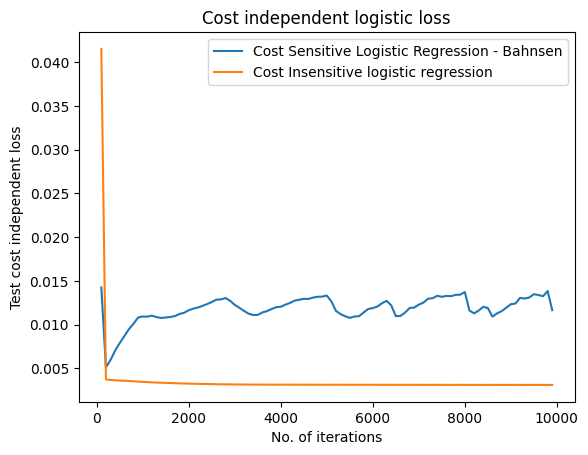

In [28]:
with torch.no_grad():
  #plt.plot(X, b_nn_testLRLosses, label='Neural Network - Bahnsen')
  plt.plot(X, b_cslr_testLRLosses, label='Cost Sensitive Logistic Regression - Bahnsen')
  plt.plot(X, b_lr_testLRLosses, label = 'Cost Insensitive logistic regression')
  plt.xlabel('No. of iterations')
  plt.ylabel('Test cost independent loss')
  plt.title('Cost independent logistic loss')
  plt.legend()
  plt.show()

Classification accuracy

In [29]:
#b_nn_testAccs_list = [tensor.item() for tensor in b_nn_testAccs]
b_cslr_testAccs_list = [tensor.item() for tensor in b_cslr_testAccs]
b_lr_testAccs_list = [tensor.item() for tensor in b_lr_testAccs]

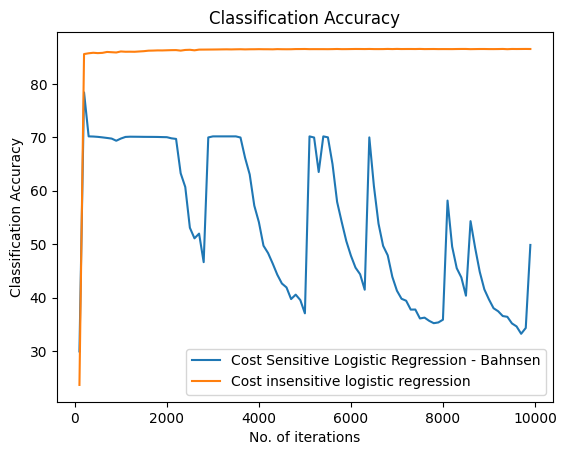

In [30]:
with torch.no_grad():
  #plt.plot(X, b_nn_testAccs_list, label='Neural Network - Bahnsen')
  plt.plot(X, b_cslr_testAccs_list, label='Cost Sensitive Logistic Regression - Bahnsen')
  plt.plot(X, b_lr_testAccs_list, label = 'Cost insensitive logistic regression')
  plt.xlabel('No. of iterations')
  plt.ylabel('Classification Accuracy')
  plt.title('Classification Accuracy')
  plt.legend()
  plt.show()

Cost sensitive loss

In [31]:
#b_nn_testCSLRLosses_list = [tensor.item() for tensor in b_nn_testCSLRLosses]
b_cslr_testCSLRLosses_list = [tensor.item() for tensor in b_cslr_testCSLRLosses]
b_lr_testCSLRLosses_list = [tensor.item() for tensor in b_lr_testAccs]

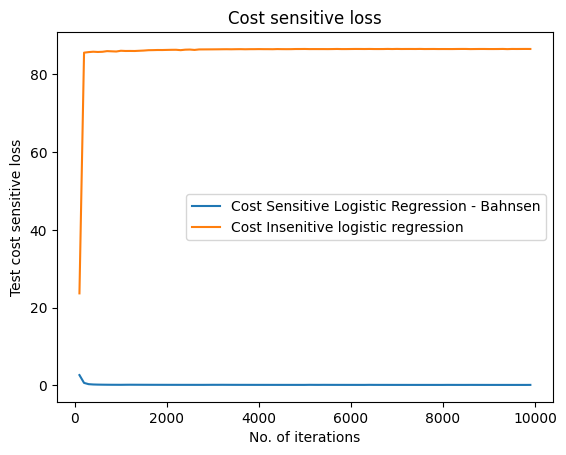

In [32]:
#plt.plot(X, b_nn_testCSLRLosses_list, label='Neural Network - Bahnsen')
plt.plot(X, b_cslr_testCSLRLosses_list, label='Cost Sensitive Logistic Regression - Bahnsen')
plt.plot(X, b_lr_testCSLRLosses_list, label = 'Cost Insenitive logistic regression')
plt.xlabel('No. of iterations')
plt.ylabel('Test cost sensitive loss')
plt.title('Cost sensitive loss')
plt.legend()
plt.show()

**Gunneman approach**

---



Cost independent logistic loss

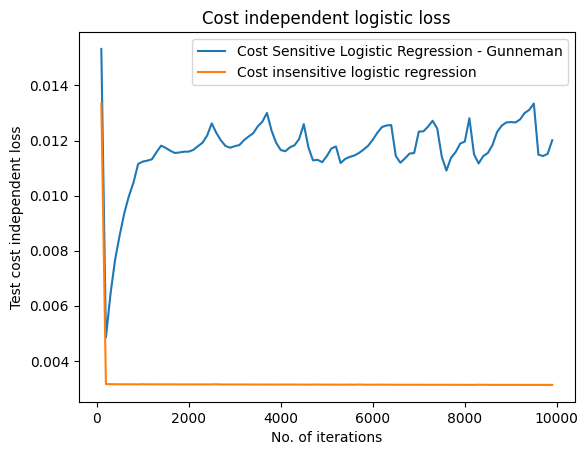

In [35]:
with torch.no_grad():
  #plt.plot(X, g_nn_testLRLosses, label='Neural Network - Gunneman')
  plt.plot(X, g_cslr_testLRLosses, label='Cost Sensitive Logistic Regression - Gunneman')
  plt.plot(X, g_lr_testLRLosses, label = 'Cost insensitive logistic regression')
  plt.xlabel('No. of iterations')
  plt.ylabel('Test cost independent loss')
  plt.title('Cost independent logistic loss')
  plt.legend()
  plt.show()

Classification accuracy

In [37]:

#g_nn_testAccs_list = [tensor.item() for tensor in g_nn_testAccs]
g_cslr_testAccs_list = [tensor.item() for tensor in g_cslr_testAccs]
g_lr_testAccs_list = [tensor.item() for tensor in g_lr_testAccs]

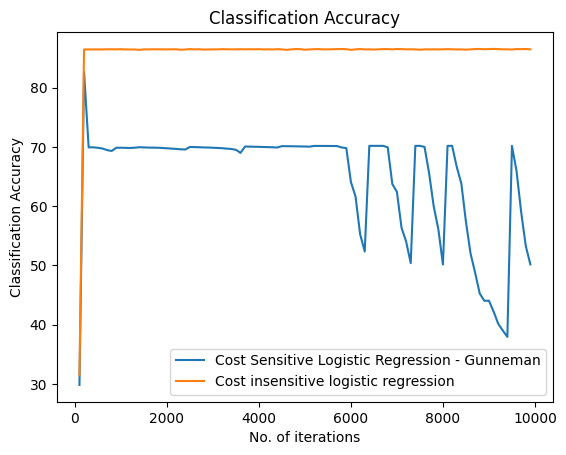

In [38]:
with torch.no_grad():
  #plt.plot(X, g_nn_testAccs_list, label='Neural Network - Gunneman')
  plt.plot(X, g_cslr_testAccs_list, label='Cost Sensitive Logistic Regression - Gunneman')
  plt.plot(X, g_lr_testAccs_list, label = 'Cost insensitive logistic regression')
  plt.xlabel('No. of iterations')
  plt.ylabel('Classification Accuracy')
  plt.title('Classification Accuracy')
  plt.legend()
  plt.show()

Cost sensitive loss

In [39]:
#g_nn_testCSLRLosses_list = [tensor.item() for tensor in g_nn_testCSLRLosses]
g_cslr_testCSLRLosses_list = [tensor.item() for tensor in g_cslr_testCSLRLosses]
g_lr_testCSLRLosses_list = [tensor.item() for tensor in g_lr_testAccs]

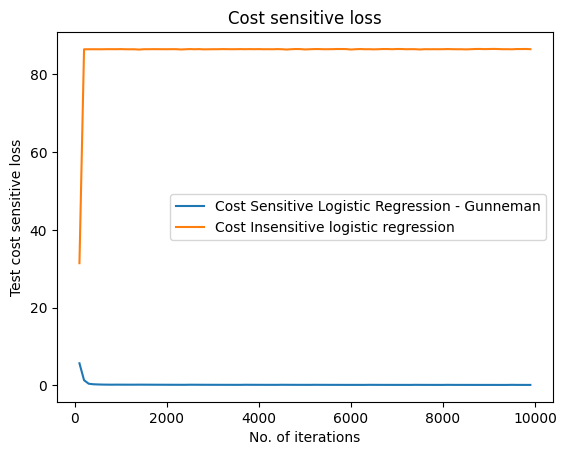

In [40]:
#plt.plot(X, g_nn_testCSLRLosses_list, label='Neural Network - Gunneman')
plt.plot(X, g_cslr_testCSLRLosses_list, label='Cost Sensitive Logistic Regression - Gunneman')
plt.plot(X, g_lr_testCSLRLosses_list, label = 'Cost Insensitive logistic regression')
plt.xlabel('No. of iterations')
plt.ylabel('Test cost sensitive loss')
plt.title('Cost sensitive loss')
plt.legend()
plt.show()